# Task 3: Helper notebook for loading the data and saving the predictions

In [1]:
import pickle
import gzip
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML  # For rendering animation in Jupyter

### Helper functions

In [2]:
def load_zipped_pickle(filename):
    with gzip.open(filename, 'rb') as f:
        loaded_object = pickle.load(f)
        return loaded_object

In [3]:
def save_zipped_pickle(obj, filename):
    with gzip.open(filename, 'wb') as f:
        pickle.dump(obj, f, 2)

### Load data, make predictions and save prediction in correct format

In [4]:
# load data
def load_zipped_pickle(filename):
    try:
        with gzip.open(filename, 'rb') as f:
            loaded_object = pickle.load(f)
            return loaded_object
    except Exception as e:
        print(f"Error loading {filename}: {type(e).__name__}: {e}")
        raise

# Try loading with verbose output
print("Loading sample.csv...")
samples = pd.read_csv("sample.csv")
print(f"✓ Loaded samples with shape {samples.shape}")

print("Loading train.pkl...")
train_data = load_zipped_pickle("train.pkl")
print(f"✓ Loaded train_data with {len(train_data)} items")

print("Loading test.pkl...")
test_data = load_zipped_pickle("test.pkl")
print(f"✓ Loaded test_data with {len(test_data)} items")

Loading sample.csv...
✓ Loaded samples with shape (762719, 2)
Loading train.pkl...
✓ Loaded train_data with 65 items
Loading test.pkl...
✓ Loaded test_data with 20 items


In [6]:
from tqdm import tqdm
import matplotlib.pyplot as plt

def preprocess_train_data(data):
    video_frames = []
    mask_frames = []
    names = []
    for item in tqdm(data):
        video = item['video']
        name = item['name']
        height, width, n_frames = video.shape
        mask = np.zeros((height, width, n_frames), dtype=np.bool)
        for frame in item['frames']:
            mask[:, :, frame] = item['label'][:, :, frame]
            video_frame = video[:, :, frame]
            mask_frame = mask[:, :, frame]
            video_frame = np.expand_dims(video_frame, axis=2).astype(np.float32)
            mask_frame = np.expand_dims(mask_frame, axis=2).astype(np.int32)
            video_frames.append(video_frame)
            mask_frames.append(mask_frame)
            names.append(name)
    return names, video_frames, mask_frames

def preprocess_test_data(data):
    video_frames = []
    names = []
    for item in tqdm(data):
        video = item['video']
        video = video.astype(np.float32).transpose((2, 0, 1))
        video = np.expand_dims(video, axis=3)
        video_frames += list(video)
        names += [item['name'] for _ in video]
    return names, video_frames

In [7]:
names, videos, masks = preprocess_train_data(train_data)
test_names, test_videos = preprocess_test_data(test_data)

100%|██████████| 20/20 [00:00<00:00, 37.32it/s]


### From the flattented array, retrieve indices and length for submission format

In [8]:
def get_sequences(arr):
    first_indices, last_indices, lengths = [], [], []
    n, i = len(arr), 0
    arr = [0] + list(arr) + [0]
    for index, value in enumerate(arr[:-1]):
        if arr[index+1]-arr[index] == 1:
            first_indices.append(index)
        if arr[index+1]-arr[index] == -1:
            last_indices.append(index)
    lengths = list(np.array(last_indices)-np.array(first_indices))
    return first_indices, lengths

Video: YEZ7BPLZW0 (Dataset: expert)
Total frames: 76
Labeled frames: [20, 34, 68] (out of 0 to 75)
Frame 20 mask stats: 3304 pixels labeled (should be >0 if valid)
Frame 34 mask stats: 2280 pixels labeled (should be >0 if valid)
Frame 68 mask stats: 2652 pixels labeled (should be >0 if valid)


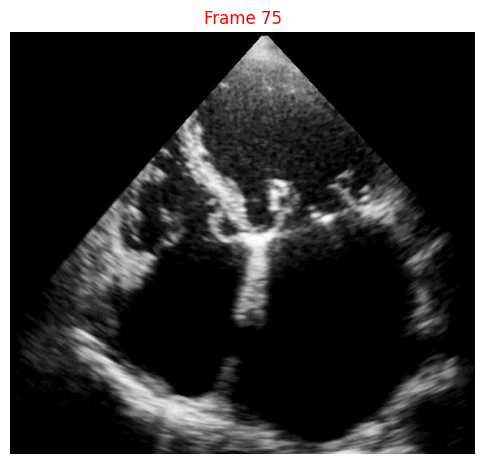

In [12]:
# Select an expert video: Find the first one with 'dataset' == 'expert'
# Note: We use a different variable name ('item') in the loop to avoid overwriting/conflicts
# Concept: Variable shadowing can lead to bugs—always use descriptive, unique names for clarity
expert_data = None  # Placeholder; we'll assign the first matching video
for idx, item in enumerate(train_data):
    if item['dataset'] == 'expert':
        expert_data = item
        break

# If no expert found (unlikely), this would be None—add a check in real code
if expert_data is None:
    raise ValueError("No expert dataset video found in train_data")

# Now extract fields from the expert data
video_name = expert_data['name']
video = expert_data['video']  # Shape: (height, width, num_frames)
labels = expert_data['label']  # Mask: Same shape, boolean (True where mitral valve)
labeled_frames = expert_data['frames']  # List of indices with labels

# Print info: Instead of printing the raw labels array (which just shows <array object>),
# let's print useful stats. Concept: Large arrays like labels don't print nicely—summarize instead!
# This helps debug: If sums are 0, masks might be empty (data issue)
print(f"Video: {video_name} (Dataset: {expert_data['dataset']})")
print(f"Total frames: {video.shape[2]}")
print(f"Labeled frames: {labeled_frames} (out of 0 to {video.shape[2]-1})")
for f in labeled_frames:
    mask_sum = labels[:, :, f].sum()  # Number of True pixels in this frame's mask
    print(f"Frame {f} mask stats: {mask_sum} pixels labeled (should be >0 if valid)")

# Set up figure for animation
fig, ax = plt.subplots(figsize=(6, 6))
ax.axis('off')

# Two image artists: One for the grayscale video frame, one for the red mask overlay
# Concept: imshow can layer multiple images; use alpha for transparency to "highlight" without obscuring
im_video = ax.imshow(video[:, :, 0], cmap='gray', vmin=0, vmax=255)  # Base ultrasound image
im_mask = ax.imshow(np.zeros_like(video[:, :, 0], dtype=float), cmap='Reds', alpha=0.0, vmin=0, vmax=1)  # Overlay, initially hidden

# Update function: Called per frame
def update(frame_num):
    # Always update the video frame
    im_video.set_data(video[:, :, frame_num])
    
    if frame_num in labeled_frames:
        # Get mask slice: Boolean to float (0/1) for imshow
        # Concept: Masks are boolean, but colormaps need numeric (0-1 range); True becomes 1 (red), False 0 (transparent)
        mask = labels[:, :, frame_num].astype(float)
        
        # Update overlay: Set data and make visible
        im_mask.set_data(mask)
        im_mask.set_alpha(0.4)  # Adjust 0.1-0.6 for visibility—too high hides the image, too low is faint
        
        ax.set_title(f"Frame {frame_num} (Labeled with red overlay)", color='red')
    else:
        # Hide overlay on unlabeled frames
        im_mask.set_alpha(0.0)
        ax.set_title(f"Frame {frame_num}")
    
    return [im_video, im_mask]  # Blit both for efficiency

# Create animation
ani = FuncAnimation(fig, update, frames=range(video.shape[2]), interval=50, blit=True)

# Display
HTML(ani.to_jshtml())

### Create .csv in submission format

In [ ]:

df = pd.DataFrame({"id":ids, "value":[list(map(int, minili)) for minili in values]})
df.to_csv(f"mysubmissionfile_{THRESHOLD}.csv", index=False)

NameError: name 'ids' is not defined